# Exploring Property Tax Assessments in New York City
Group Members: Mohammed Azad, Jacob Basinger, Jeremy Epstein

## Introduction

New York City is home to some of the most valuable real estate in the world.  The city’s collective property was recently assessed at a staggering $1.4 trillion.  This value does not merely represent property-owning New Yorkers' wealth; it enables the city to function. Real estate taxes (of which property taxes make up the vast majority) constitute more than half of the city's tax revenues, funding the provision of basic services from schools to police.

Property valuations for tax purposes are assessed through a complicated and contentious process, and property owners have the right to petition the city to reassess their property's value if they feel it is too high.  In this notebook, we analyze publicly available data on property valuations from the NYC Department of Finance and owner-initated tax re-assessment actions from the Tax Commission.  We then bring in census data to learn more about the social demographics in the areas where most reassessment actions have occurred.

Analyzed together, these data can help paint a picture of where property valuations are getting the biggest reassessment breaks - and who is benefiting as a result.


## Part 1: Loading Data
We obtained and cleaned this data in a supplementary notebook. Here, we will just read in the pre-created files.

In [1]:
import pandas as pd
import geopandas as gpd
from sodapy import Socrata
import matplotlib.pyplot as plt
import contextily as ctx
import seaborn as sns

In [2]:
# This is the file with property valuation and assessment data
inner_joined_gdf = gpd.read_file('../uds-project-1/finalpropertydata.geoJSON')
inner_joined_gdf.to_crs('EPSG:3857', inplace=True)

In [3]:
# This is the file with the census data
censusGdf = gpd.read_file('../uds-project-1/fullcensusdata.geojson').set_crs('EPSG:3857', allow_override=True)

Joining the census file with the property file

In [4]:
sjoindf = censusGdf.sjoin(inner_joined_gdf, how='left')
sjoindf.head()

,GEOID,median_age,total_population,total_white,total_black,total_americanindian,total_asian,total_hawaiian,total_otherrace,total_twoplusraces,...,block_number,lot_number,tax_year,owner_name,property_address,granted_reduction_amount,tax_class_code,BBB_test_actions,reduction_scaled,valid_geo
0,36061031900,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,36061006900,35.2,2568.0,2037.0,53.0,0.0,293.0,0.0,57.0,128.0,...,601,1201,2018,43 CLARKSON HOLDING L,43 CLARKSON STREET,126550.0,4,1-601-1201,0.461020,False
1,36061006900,35.2,2568.0,2037.0,53.0,0.0,293.0,0.0,57.0,128.0,...,602,68,2018,TRINITY HUDSON HOLDIN,435 HUDSON STREET,2043650.0,4,1-602-68,0.064497,False
1,36061006900,35.2,2568.0,2037.0,53.0,0.0,293.0,0.0,57.0,128.0,...,601,52,2018,ROYALTON REAL ESTATE,110 LEROY STREET,422500.0,4,1-601-52,0.054394,False
1,36061006900,35.2,2568.0,2037.0,53.0,0.0,293.0,0.0,57.0,128.0,...,602,10,2018,"EQR - 600 WASHINGTON,",600 WASHINGTON STREET,2822750.0,2,1-602-10,0.138082,False


In [5]:
# Making a new df with the total reduction amount granted per tract and joining it to census df
reductionpertract = sjoindf.groupby('tract')[['granted_reduction_amount']].sum()
reductionpertract.rename(columns={'granted_reduction_amount':'total_tract_reduction'}, inplace=True)
censusjoined = censusGdf.join(reductionpertract, on='tract')

In [6]:
# Making a new df with the total number of reductions per tract
# Adding another column for the total number of property reductions in a census tract
numberreductions = sjoindf.groupby('tract')[['tract']].count()
numberreductions.rename(columns={'tract':'number_reductions'}, inplace=True)
censusjoined = censusjoined.join(numberreductions, on='tract')
censusjoined.head()

,GEOID,median_age,total_population,total_white,total_black,total_americanindian,total_asian,total_hawaiian,total_otherrace,total_twoplusraces,total_hisp_latino,pop_under18,median_HH_income,county,tract,pct_renter,geometry,total_tract_reduction,number_reductions
0,36061031900,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,061,031900,NaN,"POLYGON ((-8240500.560 4968891.470, -8239842.1...",247760.0,7
1,36061006900,35.2,2568.0,2037.0,53.0,0.0,293.0,0.0,57.0,128.0,161.0,341.0,198636.0,061,006900,60.673235,"POLYGON ((-8239939.840 4972655.360, -8239911.7...",12443467.0,27
2,36061010300,33.6,1674.0,1130.0,90.0,4.0,324.0,5.0,10.0,111.0,143.0,75.0,98901.0,061,010300,87.114846,"POLYGON ((-8237738.160 4975861.700, -8237700.9...",9002375.0,24
3,36061008700,35.8,6815.0,5493.0,85.0,0.0,579.0,0.0,478.0,180.0,1165.0,610.0,153350.0,061,008700,65.910868,"POLYGON ((-8237672.930 4974484.150, -8237645.8...",22045692.0,51
4,36061011100,33.4,5012.0,3111.0,367.0,0.0,1241.0,0.0,110.0,183.0,925.0,440.0,105887.0,061,011100,89.008942,"POLYGON ((-8237493.260 4976308.140, -8237467.7...",19544938.0,21


## Part 2: Mapping

This map shows the percent reductions across NYC.

Text(0.5, 1.0, 'NYC Reductions')

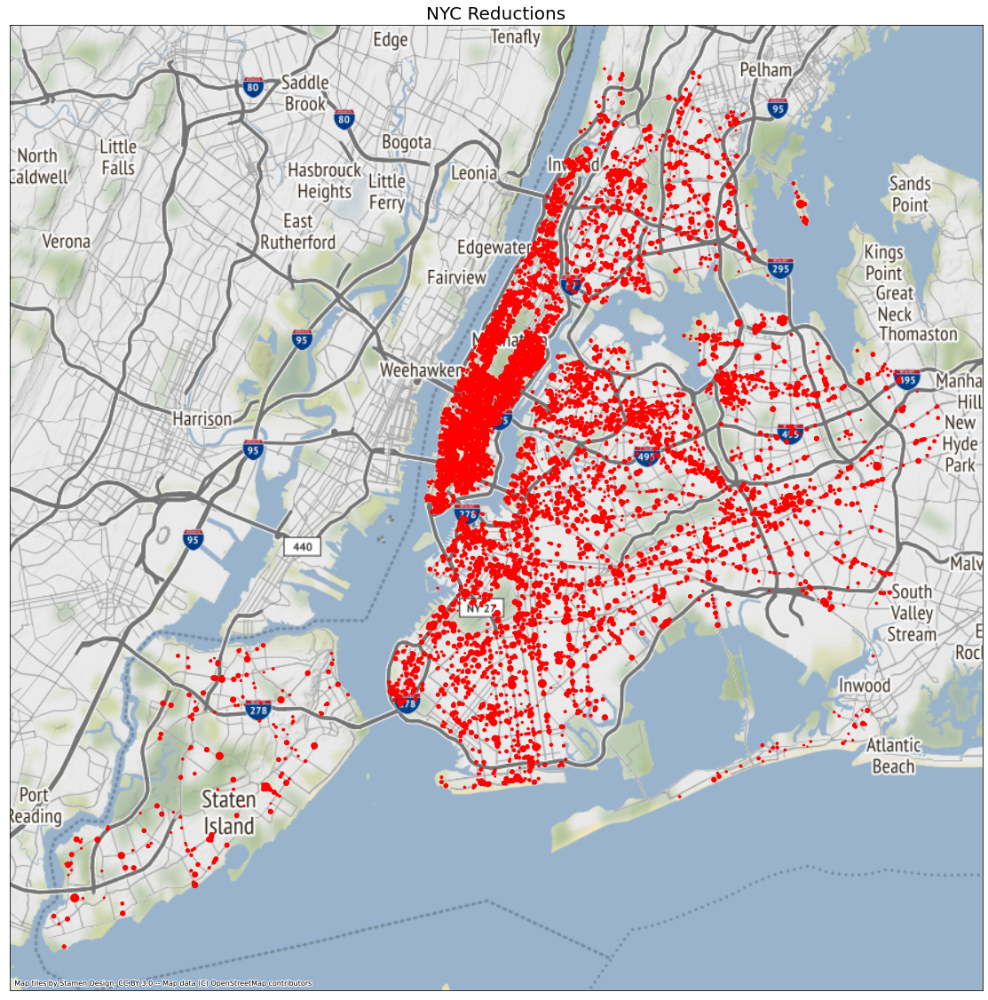

In [7]:
fig, ax = plt.subplots(figsize=(20,20))
inner_joined_gdf.plot(ax=ax, color='red', markersize=inner_joined_gdf['reduction_scaled']*100)
ctx.add_basemap(ax)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title('NYC Reductions', fontsize=20)

It appears Manhattan has the highest density of property reassessments, while Staten Island has the lowest.  We break down the data by borough below:

In [8]:
boros=[['1','Manhattan Reductions'], ['2','Bronx Reductions'], ['3','Brooklyn Reductions'], ['4','Queens Reductions'], ['5','Staten Island Reductions']]

In [9]:
boros

[['1', 'Manhattan Reductions'],
 ['2', 'Bronx Reductions'],
 ['3', 'Brooklyn Reductions'],
 ['4', 'Queens Reductions'],
 ['5', 'Staten Island Reductions']]

In [10]:
def map_boro_reductions(boro, title):
    fig, ax = plt.subplots(figsize=(10,10))
    inner_joined_gdf[inner_joined_gdf['boro']==boro].to_crs('EPSG:3857').plot(ax=ax, color='red', markersize=inner_joined_gdf['reduction_scaled']*100)
    ctx.add_basemap(ax)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(title)

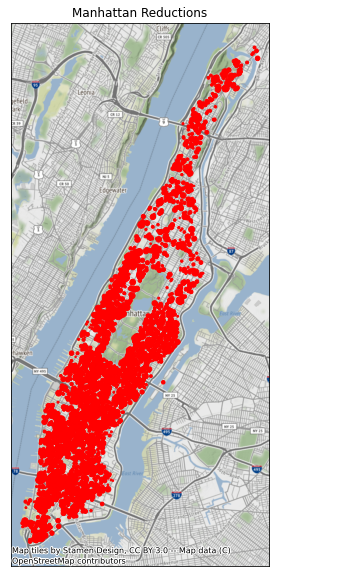

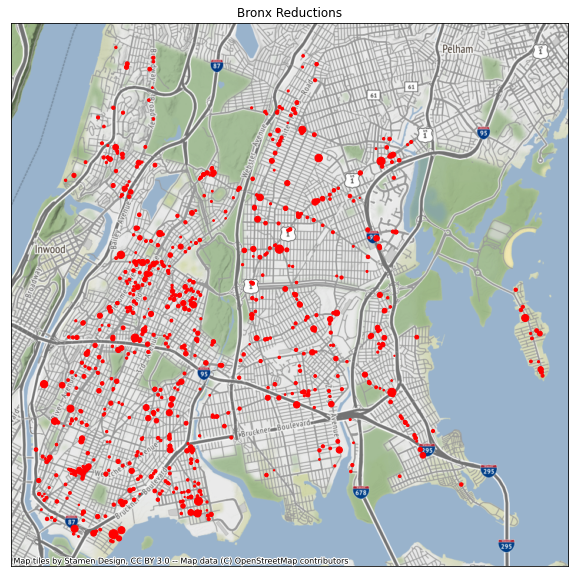

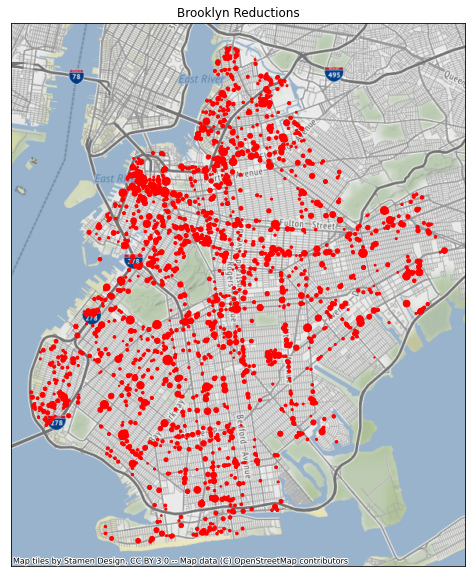

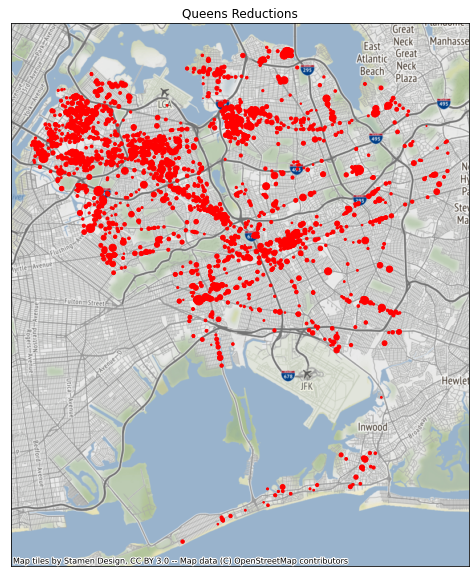

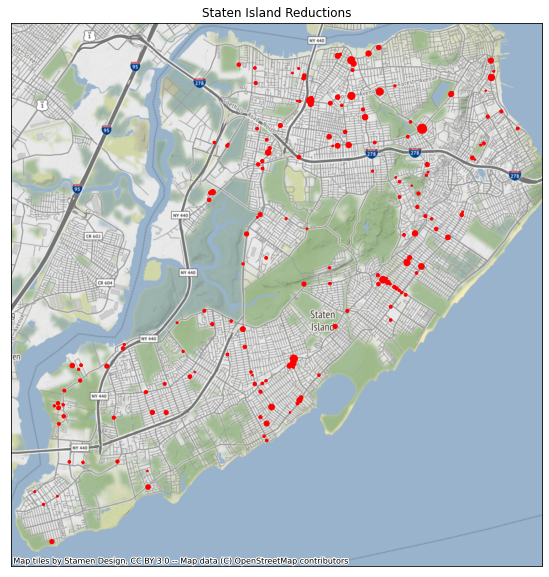

In [11]:
for boro, title in boros:
    map_boro_reductions(boro, title)

Because population and building densities vary widely between the boroughs, we decided to explore the differences between number of reassessments granted and the cumulative value of those reassessments across different areas of the city.  The two following maps use Census data to map the total value of reductions granted per Census tract, and the number of reductions given per Census tract.

Text(0.5, 1.0, 'Number of Reductions Granted Per Census Tract')

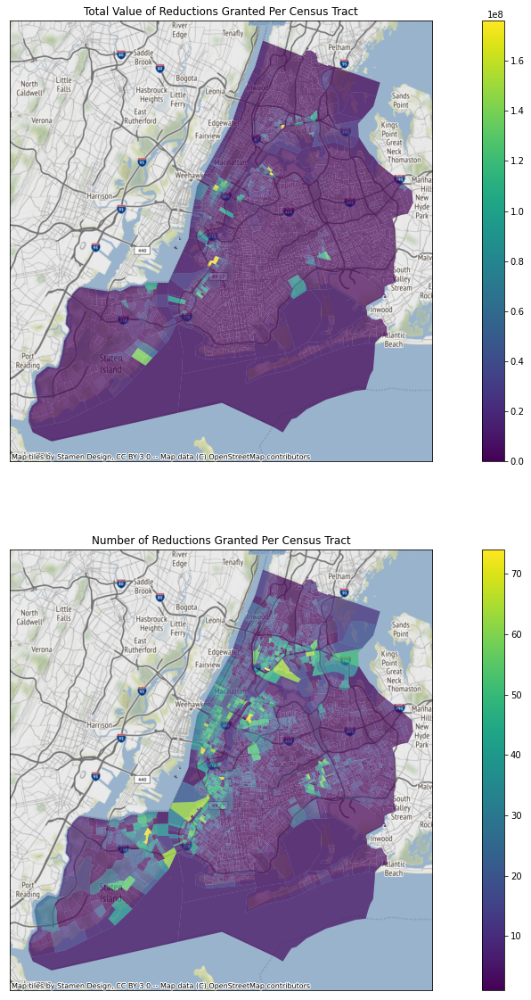

In [12]:
fig, ax = plt.subplots(2, figsize=(20,20))
ax1, ax2 = ax

censusjoined.plot(column='total_tract_reduction', aspect=1, ax=ax1, missing_kwds= dict(color = "grey"), alpha=.7, legend=True)
ctx.add_basemap(ax1)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_title("Total Value of Reductions Granted Per Census Tract")

censusjoined.plot(column='number_reductions', aspect=1, ax=ax2, missing_kwds= dict(color = "grey"), alpha=.7, legend=True)
ctx.add_basemap(ax2)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_title("Number of Reductions Granted Per Census Tract")

Even though our first map showed that reassessment actinos occurred all over the city, the first map above shows that the total value of the write-downs in property value are overwhelmingly located in a relatively small number of census tracts in Midtown Manhattan and along certain portions of the coasts of the outer boroughs.

The second map shows that despite the significant difference in density of reassessment actions between Manhattan and Staten Island, when normalized at the census tract level, much of the two boroughs' area has experienced reassessment actions with comparable frequency.

For visual clarity, we have broken down these two analyses by borough below.

In [13]:
boroughs=[['061','Manhattan'], ['047','Brooklyn'], ['005','Bronx'], ['081','Queens'], ['085','Staten Island']]
boroughs

[['061', 'Manhattan'],
 ['047', 'Brooklyn'],
 ['005', 'Bronx'],
 ['081', 'Queens'],
 ['085', 'Staten Island']]

In [14]:
def boroughplot(borocode, boro, column):
    fig, ax = plt.subplots(figsize=(10,10))
    censusjoined[censusjoined['county']==borocode].to_crs('EPSG:3857').plot(column=column, aspect=1, ax=ax, missing_kwds= dict(color = "grey"), alpha=.7, legend=True)
    ctx.add_basemap(ax)
    ax.set_xticks([])
    ax.set_yticks([])
    if column=='total_tract_reduction':
        ax.set_title(boro+' Total Tract Reductions')
    if column=='number_reductions':
        ax.set_title(boro+' Number of Reductions')

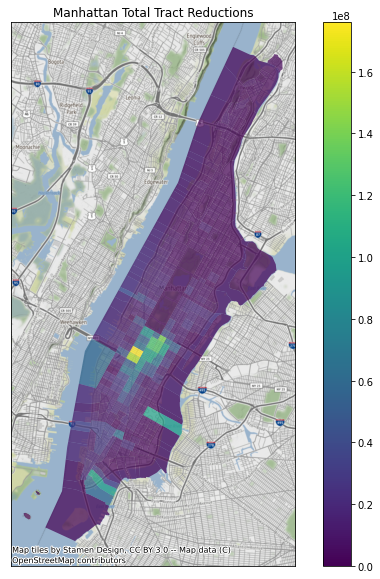

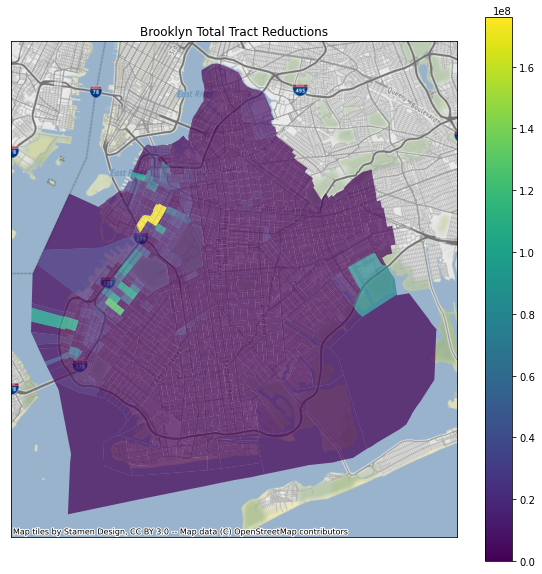

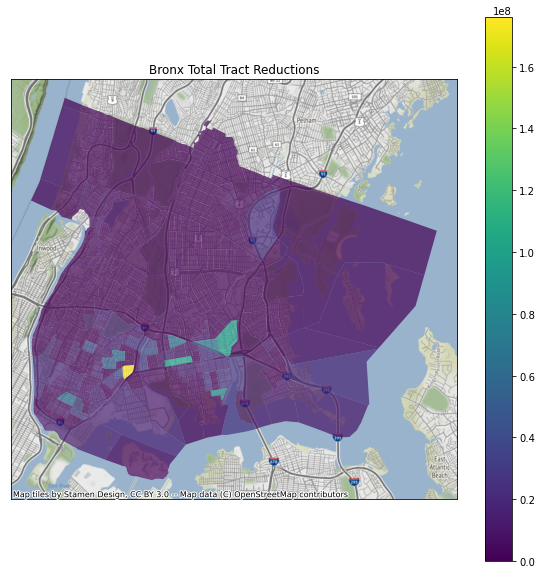

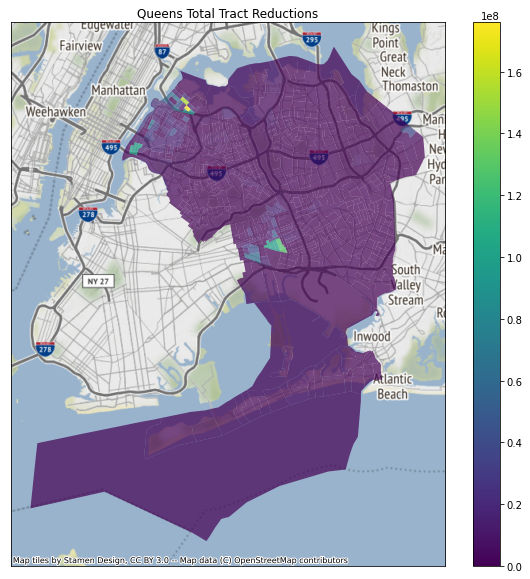

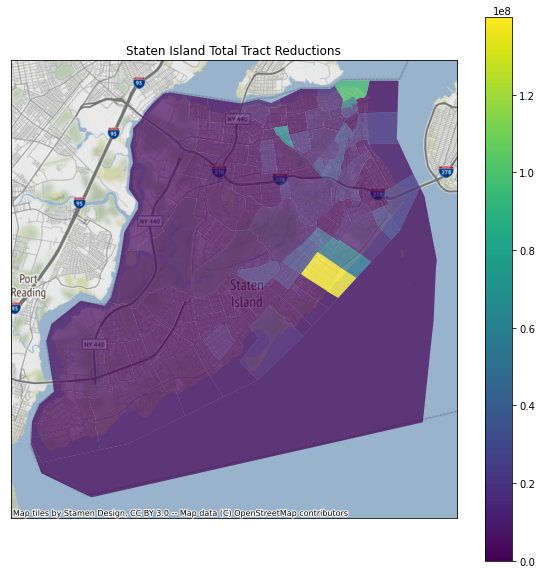

In [15]:
# For total value of tract reductions
for borocode, boro in boroughs:
    boroughplot(borocode, boro, 'total_tract_reduction')

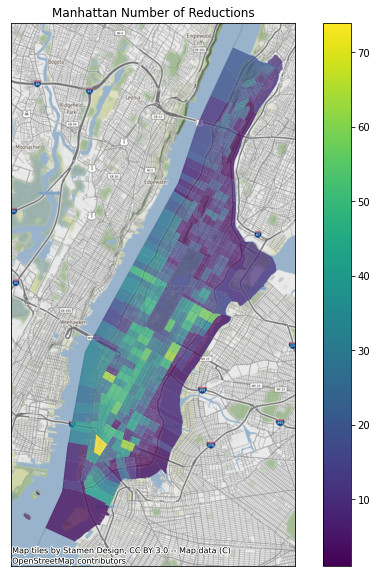

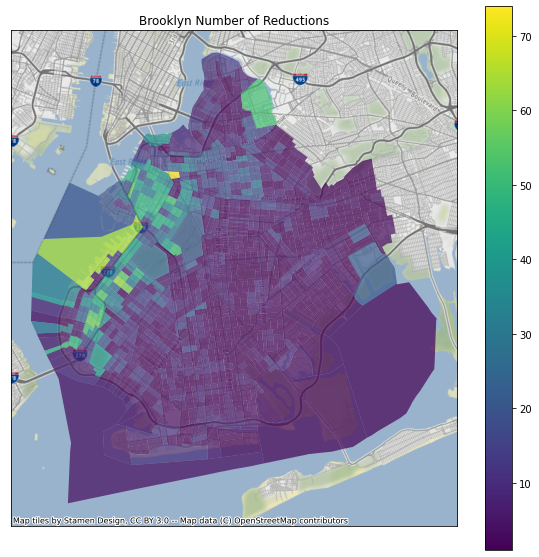

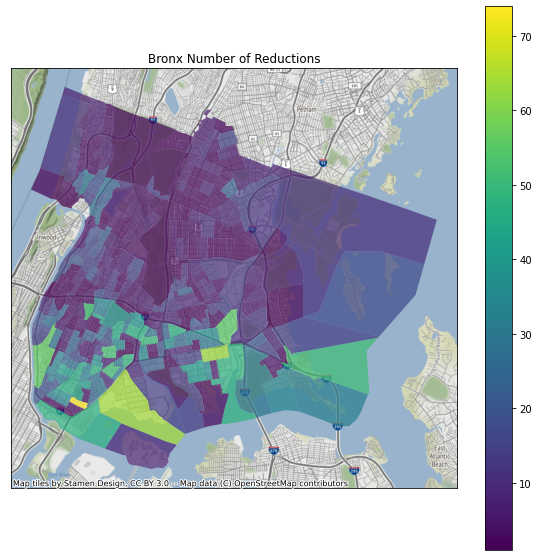

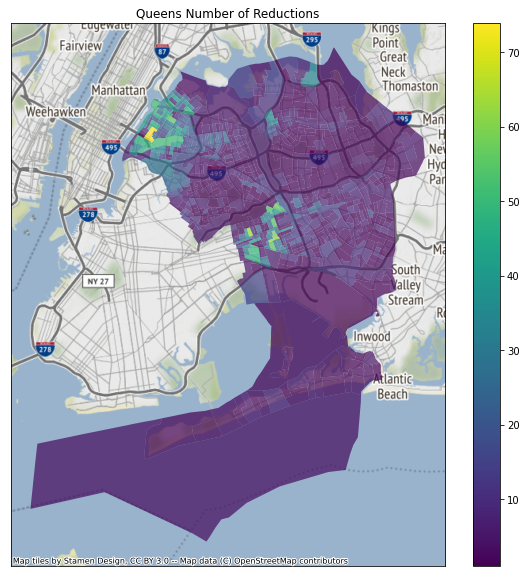

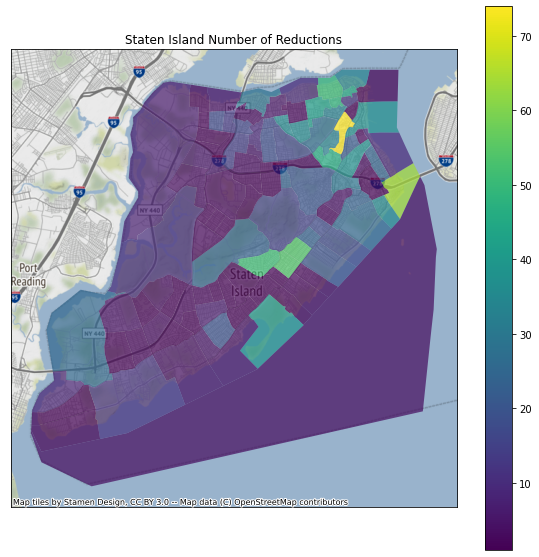

In [16]:
# Number of reductions per tract
for borocode, boro in boroughs:
    boroughplot(borocode, boro, 'number_reductions')

Now that we have some understanding of where property reassessments for tax purposes are happening, we will use machine learning to explore what factors, both physical and socio-demograhic, may be associated with the likelihood of a property being reassessed.

## Part 3: Machine Learning

### 1. Assessing the Total Value of Reductions in a Census Tract

To start, we will pull in census data to a random forests model to see how age, race, and housing tenure (renter status) relate to tax reassessment actions.

In [17]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

xvars = ['median_age', 'total_population', 'total_white',
       'total_black', 'total_americanindian', 'total_asian', 'total_hawaiian',
       'total_otherrace', 'total_twoplusraces', 'total_hisp_latino',
       'pop_under18', 'median_HH_income', 'county', 'pct_renter']

yvar = 'total_tract_reduction'

df_to_fit = censusjoined[xvars+[yvar]].dropna()

X_train, X_test, y_train, y_test = train_test_split(df_to_fit[xvars], df_to_fit[yvar], test_size = 0.25, random_state = 1)

# check we have a reasonable split
print(len(X_train), len(y_train) )
print(len(X_test), len(y_test) )

1578 1578
526 526


In [18]:
rf = RandomForestRegressor(n_estimators = 50, random_state = 1)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
print(len(X_test), len(y_pred))

526 526


In [19]:
import numpy as np
from sklearn import metrics

print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error (RMSE):', metrics.mean_squared_error(y_test, y_pred, squared=False))
print('Mean Absolute Percentage Error (MAPE):', metrics.mean_absolute_percentage_error(y_test, y_pred))
print('Explained Variance Score:', metrics.explained_variance_score(y_test, y_pred))
print('Max Error:', metrics.max_error(y_test, y_pred))
print('Mean Squared Log Error:', metrics.mean_squared_log_error(y_test, y_pred))
print('Median Absolute Error:', metrics.median_absolute_error(y_test, y_pred))
print('R^2:', metrics.r2_score(y_test, y_pred))
print('Mean Poisson Deviance:', metrics.mean_poisson_deviance(y_test, y_pred))

Mean Absolute Error (MAE): 8114391.423878327
Mean Squared Error (MSE): 324837836314109.25
Root Mean Squared Error (RMSE): 18023258.204722844
Mean Absolute Percentage Error (MAPE): 2.430131907838152e+21
Explained Variance Score: 0.1399799826319954
Max Error: 170310678.4
Mean Squared Log Error: 29.241778259973717
Median Absolute Error: 3171042.7199999997
R^2: 0.13914524650932936
Mean Poisson Deviance: 18027743.562880006


Now we can create a visualization of the feature importances - the x variables most closely tied to total reduction in assessed value - according to the ML random forest model.

Text(0, 0.5, 'Mean decrease in impurity')

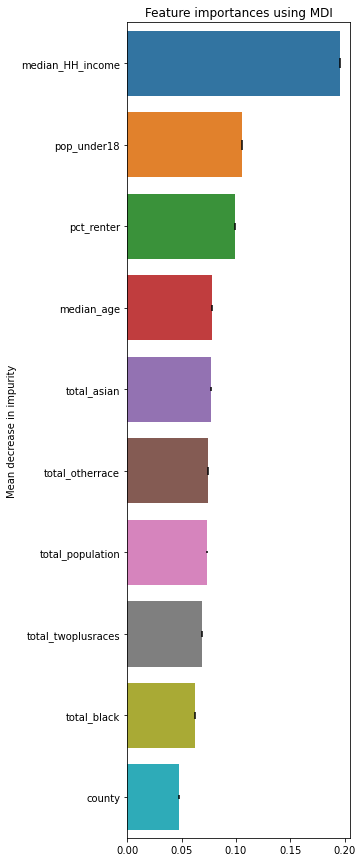

In [20]:
importances = rf.feature_importances_

# Convert to a series, and give the index labels from our X_train dataframe
forest_importances = pd.Series(importances, index=X_train.columns)

# Get the standard deviations to be able to plot the error bars
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

# Sort the importances in descending order
forest_importances.sort_values(inplace=True, ascending=False)

# Plot
fig, ax = plt.subplots(figsize=(4,15))
sns.barplot(x=forest_importances.values[:10], y=forest_importances.index[:10],yerr=std[:10], ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

The most influential factor in predicting reassessment value by far is **median household income.**

### 2. Assessing the Total Number of Reductions in a Census Tract

Here, we repeat the same ML analysis but taking total number of reductions, rather than total value of reductions, as our Y-variable.

In [21]:
xvars = ['median_age', 'total_population', 'total_white',
       'total_black', 'total_americanindian', 'total_asian', 'total_hawaiian',
       'total_otherrace', 'total_twoplusraces', 'total_hisp_latino',
       'pop_under18', 'median_HH_income', 'county', 'pct_renter']

yvar = 'number_reductions'

df_to_fit = censusjoined[xvars+[yvar]].dropna()

X_train, X_test, y_train, y_test = train_test_split(df_to_fit[xvars], df_to_fit[yvar], test_size = 0.25, random_state = 1)

# check we have a reasonable split
print(len(X_train), len(y_train) )
print(len(X_test), len(y_test) )

1578 1578
526 526


In [22]:
rf = RandomForestRegressor(n_estimators = 50, random_state = 1)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
print(len(X_test), len(y_pred))

526 526


In [23]:
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error (RMSE):', metrics.mean_squared_error(y_test, y_pred, squared=False))
print('Mean Absolute Percentage Error (MAPE):', metrics.mean_absolute_percentage_error(y_test, y_pred))
print('Explained Variance Score:', metrics.explained_variance_score(y_test, y_pred))
print('Max Error:', metrics.max_error(y_test, y_pred))
print('Mean Squared Log Error:', metrics.mean_squared_log_error(y_test, y_pred))
print('Median Absolute Error:', metrics.median_absolute_error(y_test, y_pred))
print('R^2:', metrics.r2_score(y_test, y_pred))
print('Mean Poisson Deviance:', metrics.mean_poisson_deviance(y_test, y_pred))

Mean Absolute Error (MAE): 8.253954372623573
Mean Squared Error (MSE): 138.4900235741445
Root Mean Squared Error (RMSE): 11.768178430587483
Mean Absolute Percentage Error (MAPE): 2.3731545051664713
Explained Variance Score: 0.22528643508344703
Max Error: 65.44
Mean Squared Log Error: 0.9595410972819475
Median Absolute Error: 6.24
R^2: 0.21712504634091656
Mean Poisson Deviance: 9.506358894912838


Text(0, 0.5, 'Mean decrease in impurity')

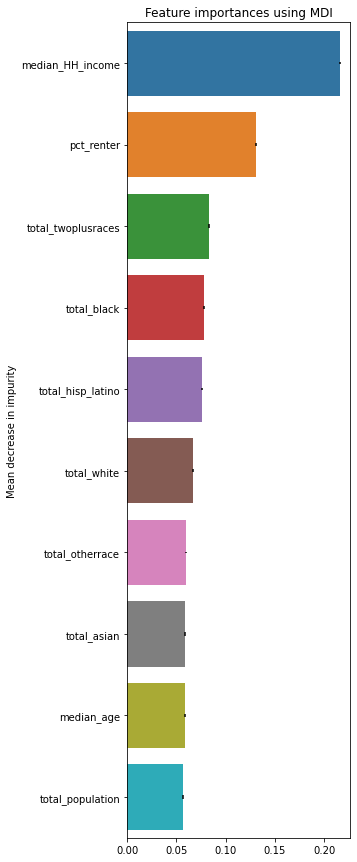

In [24]:
importances = rf.feature_importances_

# Convert to a series, and give the index labels from our X_train dataframe
forest_importances = pd.Series(importances, index=X_train.columns)

# Get the standard deviations to be able to plot the error bars
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

# Sort the importances in descending order
forest_importances.sort_values(inplace=True, ascending=False)

# Plot
fig, ax = plt.subplots(figsize=(4,15))
sns.barplot(x=forest_importances.values[:10], y=forest_importances.index[:10],yerr=std[:10], ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

Once again, **median household income** is the best predictor of reassessment actions.  

### 3. Analyzing Contributing Factors to a Property Being Reassessed

The preceding analyses look at the traits of properties that *were* reassessed.  But there are also many reassement petitions which are unsuccessful.  In order to use machine learning to understand what distinguishes successful and unsuccessful petitions for reassessment, we first had to create a new column with a boolean value indicating whether or not a property was reassessed.

To do this, we performed a join, while removing duplicates, that would combine the reassessment actions dataset to the valuations dataset.

In [25]:
# Reading in the action data
actions_df = pd.read_csv('../uds-project-1/actionsdf.csv')

In [26]:
# And the valuations data...
value_gdf = gpd.read_file('zip://../uds-project-1/valuegdf.geoJSON.zip')

In [27]:
value_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1093142 entries, 0 to 1093141
Data columns (total 31 columns):
 #   Column     Non-Null Count    Dtype   
---  ------     --------------    -----   
 0   BBB        1093142 non-null  object  
 1   avland     1093142 non-null  object  
 2   latitude   1063379 non-null  object  
 3   stories    1045584 non-null  object  
 4   avtot      1093142 non-null  int64   
 5   easement   860 non-null      object  
 6   valtype    1093142 non-null  object  
 7   exland     1093142 non-null  object  
 8   year       1093142 non-null  object  
 9   taxclass   1093142 non-null  object  
 10  longitude  1063379 non-null  object  
 11  block      1093142 non-null  object  
 12  avtot2     312436 non-null   object  
 13  excd1      534184 non-null   object  
 14  bble       1093142 non-null  object  
 15  staddr     1093101 non-null  object  
 16  exmptcl    14331 non-null    object  
 17  avland2    312436 non-null   object  
 18  lot        109

In [28]:
# Creating two new datasets without duplicates, if any
print('Before dropping duplicates: {}'.format(len(actions_df)))
actions_nodupl = actions_df.groupby('BBB').first()
print('After dropping duplicates: {}'.format(len(actions_nodupl)))
actions_nodupl.index.is_unique

# And again with the other
print('Before dropping duplicates: {}'.format(len(value_gdf)))
value_nodupl = value_gdf.groupby('BBB').first()
print('After dropping duplicates: {}'.format(len(value_nodupl)))
value_nodupl.index.is_unique

Before dropping duplicates: 9767
After dropping duplicates: 9767
Before dropping duplicates: 1093142
After dropping duplicates: 1093142


True

In [29]:
# The join

NewDf_for_ML = value_nodupl.join(actions_nodupl, how='left', rsuffix=('_actions'))
print('Number of valuations: {}'.format(len(NewDf_for_ML)))
print('Number of reductions: {}'.format(NewDf_for_ML['granted_reduction_amount'].count()))

# Almost all of the reductions were added

Number of valuations: 1093142
Number of reductions: 9711


In [30]:
# Adding the new column with the boolean value and organizing the tax class variable

NewDf_for_ML.granted_reduction_amount.fillna(0,inplace=True)
NewDf_for_ML['granted_reduction_amount'] = NewDf_for_ML['granted_reduction_amount'].astype(float)
NewDf_for_ML['got_reduction'] = NewDf_for_ML['granted_reduction_amount'] > 0

NewDf_for_ML['small_residential']=NewDf_for_ML['taxclass'].str.contains('1')
NewDf_for_ML['midtolarge_residential']=NewDf_for_ML['taxclass'].str.contains('2')
NewDf_for_ML['utilities']=NewDf_for_ML['taxclass'].str.contains('3')
NewDf_for_ML['commercial_industrial']=NewDf_for_ML['taxclass'].str.contains('4')

NewDf_for_ML.head()

,avland,latitude,stories,avtot,easement,valtype,exland,year,taxclass,longitude,...,owner_name,property_address,granted_reduction_amount,tax_class_code,BBB_test_actions,got_reduction,small_residential,midtolarge_residential,utilities,commercial_industrial
BBB,,,,,,,,,,,,,,,,,,,,,
1-1-10,104445450,40.690096,None,161206200,None,AC-TR,104445450,2017/18,4,-74.012866,...,NaN,NaN,0.0,NaN,NaN,False,False,False,False,True
1-1-101,4225950,40.689887,None,12873150,None,AC-TR,4225950,2017/18,4,-74.045337,...,NaN,NaN,0.0,NaN,NaN,False,False,False,False,True
1-1-201,14972400,40.698831,None,111703950,None,AC-TR,14972400,2017/18,4,-74.039753,...,NaN,NaN,0.0,NaN,NaN,False,False,False,False,True
1-10-1,607500,40.703512,2,4093380,None,AC-TR,0,2017/18,4,-74.011606,...,NaN,NaN,0.0,NaN,NaN,False,False,False,False,True
1-10-14,7875000,40.703312,30,38897100,None,AC-TR,0,2017/18,4,-74.013038,...,BROAD FINANCIAL CENTE,33 WHITEHALL STREET,1755500.0,4,1-10-14,True,False,False,False,True


In [31]:
NewDf_for_ML.columns

Index(['avland', 'latitude', 'stories', 'avtot', 'easement', 'valtype',
       'exland', 'year', 'taxclass', 'longitude', 'block', 'avtot2', 'excd1',
       'bble', 'staddr', 'exmptcl', 'avland2', 'lot', 'boro', 'fullval', 'ext',
       'bin', 'excd2', 'owner', 'extot', 'extot2', 'exland2', 'borough',
       'BBB_test', 'geometry', 'borough_code', 'block_number', 'lot_number',
       'tax_year', 'owner_name', 'property_address',
       'granted_reduction_amount', 'tax_class_code', 'BBB_test_actions',
       'got_reduction', 'small_residential', 'midtolarge_residential',
       'utilities', 'commercial_industrial'],
      dtype='object')

Now that we have created this boolean value, we can use it as the Y-variable of a machine learning analysis to see what factors are most associated with properties getting reductions.  All properties in the city are classified into one of four tax classes depending on whether they are small-scale residential, large residential, utilities, or commerical to see if this is a meaningful category for understanding the breakdown of reassessments.

In [32]:
columns=['avland', 'latitude', 'stories', 'avtot', 'exland', 'longitude', 'extot', 'fullval']
for column in columns:
    NewDf_for_ML[column]=pd.to_numeric(NewDf_for_ML[column])
NewDf_for_ML.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 1093142 entries, 1-1-10 to 5-97-30
Data columns (total 44 columns):
 #   Column                    Non-Null Count    Dtype   
---  ------                    --------------    -----   
 0   avland                    1093142 non-null  int64   
 1   latitude                  1063379 non-null  float64 
 2   stories                   1045584 non-null  float64 
 3   avtot                     1093142 non-null  int64   
 4   easement                  860 non-null      object  
 5   valtype                   1093142 non-null  object  
 6   exland                    1093142 non-null  int64   
 7   year                      1093142 non-null  object  
 8   taxclass                  1093142 non-null  object  
 9   longitude                 1063379 non-null  float64 
 10  block                     1093142 non-null  object  
 11  avtot2                    312436 non-null   object  
 12  excd1                     534184 non-null   object  
 13  bble

In [33]:
from sklearn.model_selection import train_test_split

xvars = ['avland', 'latitude', 'stories', 'avtot', 'exland', 'longitude', 'extot', 'fullval', 'boro', 'small_residential', 'midtolarge_residential', 'utilities', 'commercial_industrial']

yvar = 'got_reduction'

df_to_fit = NewDf_for_ML[xvars+[yvar]].dropna()

X_train, X_test, y_train, y_test = train_test_split(
    df_to_fit[xvars], df_to_fit[yvar], test_size = 0.25, random_state = 1)

print(len(X_train), len(y_train) )
print(len(X_test), len(y_test) )

781638 781638
260547 260547


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators = 50, random_state = 1)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
y_pred

260547 260547
[[257977    143]
 [  2310    117]]


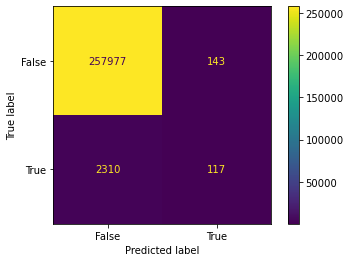

In [80]:
print(len(X_test), len(y_pred))

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay

print(confusion_matrix(y_test, y_pred))
confusion_matrix

ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

The model was fairly accurate with predicting where properties did not get reassessments (false values), but not so much at predicting where they did (true values).

Text(0, 0.5, 'Mean decrease in impurity')

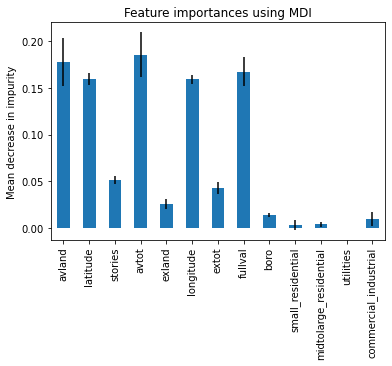

In [81]:
import numpy as np
importances = rf.feature_importances_

forest_importances = pd.Series(importances, index=X_train.columns)

std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

Text(0, 0.5, 'Mean decrease in impurity')

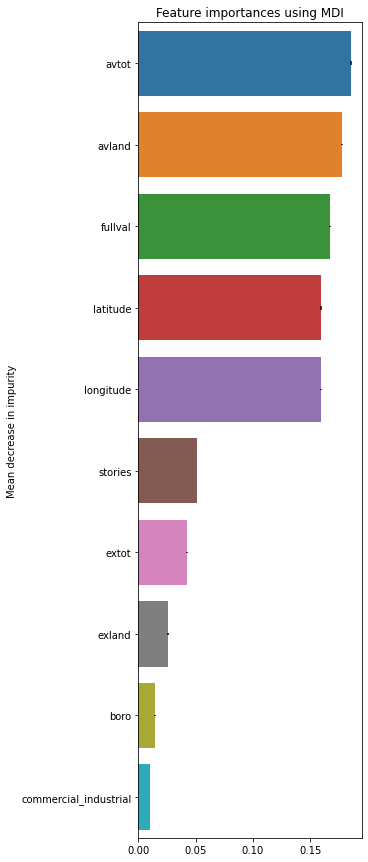

In [82]:
importances = rf.feature_importances_

# convert to a series, and give the index labels from our X_train dataframe
forest_importances = pd.Series(importances, index=X_train.columns)

# get the standard deviations to be able to plot the error bars
std = np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)

# sort the importances in descending order
forest_importances.sort_values(inplace=True, ascending=False)

# plot
fig, ax = plt.subplots(figsize=(4,15))
sns.barplot(x=forest_importances.values[:10], y=forest_importances.index[:10],yerr=std[:10], ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")

The top three factors correlating to whether a property value was reduced are all expressions of how valuable it is.  Arguably, these three variables are redudant to the extent that more valuable land nearly always hosts more valuable buildings.  Similarly, latitude and longitude, which are the next two most predictive variables, are both expressions of location.  So the best predictors of whether a property is reassessed is its value and its location.  **Given how closely related value and location are, this suggests that value is the overwhelming driver of whether a property is reassessed.**  It appears that tax class is not a particularly good predictor of whether a property is reassessed.

## Part 4. Linear Regression

We decided to do a brief linear regression analysis to see what kind of relationship each variable has on the property reassessment data. We utilized SKLearn's linear regression package.

### 1. Total Tract Reduction Value

In [83]:
def normalize_pop(pop_var):
    censusjoined[pop_var+'_normalized']=censusjoined[pop_var]/censusjoined['total_population']

In [84]:
population_vars=['total_white', 'total_black', 'total_americanindian', 'total_asian', 'total_hawaiian',
       'total_otherrace', 'total_twoplusraces', 'total_hisp_latino', 'pop_under18']

In [85]:
for var in population_vars:
    normalize_pop(var)

In [86]:
for var in population_vars:
    print(var+'_normalized')

total_white_normalized
total_black_normalized
total_americanindian_normalized
total_asian_normalized
total_hawaiian_normalized
total_otherrace_normalized
total_twoplusraces_normalized
total_hisp_latino_normalized
pop_under18_normalized


In [ ]:
from sklearn.linear_model import LinearRegression

xvars = ['median_age', 'total_population', 'total_white_normalized','total_black_normalized','total_americanindian_normalized','total_asian_normalized','total_hawaiian_normalized','total_otherrace_normalized','total_twoplusraces_normalized','total_hisp_latino_normalized','pop_under18_normalized', 'median_HH_income', 'pct_renter']

yvar = 'total_tract_reduction'

df_to_fit = censusjoined[xvars+[yvar]].dropna()

X_train, X_test, y_train, y_test = train_test_split(df_to_fit[xvars], df_to_fit[yvar], test_size = 0.25, random_state = 1)

mlr = LinearRegression()

mlr.fit(X_train, y_train)

y_pred = mlr.predict(X_test)

coefficients=mlr.coef_

In [46]:
regression_coefficients=pd.DataFrame(coefficients, columns=['Coefficient'])
regression_coefficients['variable']=xvars
regression_coefficients

,Coefficient,variable
0,-3.241637e+05,median_age
1,2.919475e+00,total_population
2,-7.052531e+06,total_white_normalized
3,-1.106561e+07,total_black_normalized
4,5.968385e+07,total_americanindian_normalized
5,-1.621685e+06,total_asian_normalized
6,-7.512866e+07,total_hawaiian_normalized
7,9.247610e+06,total_otherrace_normalized
8,2.593701e+07,total_twoplusraces_normalized
9,-7.785870e+06,total_hisp_latino_normalized


<AxesSubplot:xlabel='Coefficient', ylabel='variable'>

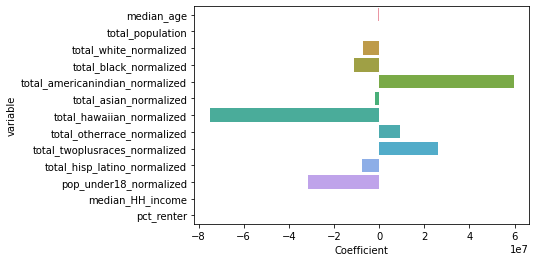

In [47]:
sns.barplot(x=regression_coefficients['Coefficient'], y=regression_coefficients['variable'])

It is important to note whether the coefficients are positive or negative. Positive coefficients mean that the variable is more likely to be associated with a larger total reduction value in a census tract, while a negative is more likely to be associated with a smaller total reduction value.

The large coefficients for Hawaiian and American Indian populations is most likely a reflection of very small sample sizes.

### 2. Number of Reductions

In [48]:
xvars = ['median_age', 'total_population', 'total_white_normalized','total_black_normalized','total_americanindian_normalized','total_asian_normalized','total_hawaiian_normalized','total_otherrace_normalized','total_twoplusraces_normalized','total_hisp_latino_normalized','pop_under18_normalized', 'median_HH_income', 'pct_renter']

yvar = 'number_reductions'

df_to_fit = censusjoined[xvars+[yvar]].dropna()

X_train, X_test, y_train, y_test = train_test_split(df_to_fit[xvars], df_to_fit[yvar], test_size = 0.25, random_state = 1)

mlr = LinearRegression()

mlr.fit(X_train, y_train)

y_pred = mlr.predict(X_test)

coefficients=mlr.coef_

regression_coefficients=pd.DataFrame(coefficients, columns=['Coefficient'])
regression_coefficients['variable']=xvars
regression_coefficients

,Coefficient,variable
0,-0.276489,median_age
1,0.000589,total_population
2,5.635156,total_white_normalized
3,-2.087352,total_black_normalized
4,43.322924,total_americanindian_normalized
5,1.153137,total_asian_normalized
6,-96.641442,total_hawaiian_normalized
7,13.755830,total_otherrace_normalized
8,34.861747,total_twoplusraces_normalized
9,-1.642395,total_hisp_latino_normalized


<AxesSubplot:xlabel='Coefficient', ylabel='variable'>

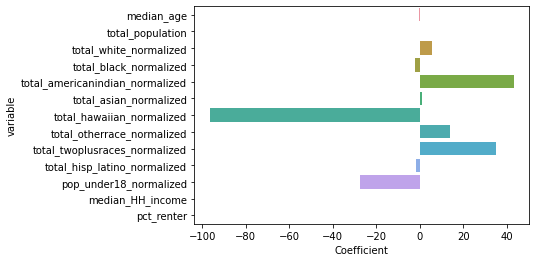

In [49]:
sns.barplot(x=regression_coefficients['Coefficient'], y=regression_coefficients['variable'])

This plot looks largely similar to the one for total value of reductions.

## Conclusion

Property tax data is a rich source of information for investigating urban inequality and understanding some of the factors that can lead a city to a healthy budget or the brink of insolvency.  The mechanism we have focussed on - owner-petitioned valuation reassessments for tax purposes - incorporates just a tiny portion of the many thousands of properties in New York, yet even this fairly limited selection of properties has the potential to teach us more about how the city's property politics function.

Our central findings include that median household income appears to be the best predictor of both how many reassessments a census tract has and the scale of their cumulative value.  On an individual property-by-property level, it appears that the best predictor of whether a property is reassessed or not is its value.

These findings raise interesting questions for future research.  Namely, does this result suggest that higher earners are simply more likely to take advantage of the reassessment process (perhaps because they own more expensive property), or is there some structural bias in the city's methodology that renders properties in higher-income census tracts more likely to be reassessed?  And similarly, does the fact that more expensive properties get written down more than less expensive ones point to a bias against some characteristic of less valuable properties? Or do the more expensive ones simply have further room to fall in value?  Answering these questions would likely involve learning more about the city's process of assessing - and reassessing - properties for tax purposes.

To learn more about the city's methods for taxing property and the sometimes surprising outcomes they create, check out this [Bloomberg](https://www.bloomberg.com/graphics/2021-new-york-property-tax-benefits-rich/) article.